In [1]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
from scipy import ndimage as ndi
from skimage.feature import peak_local_max

In [7]:
# Watershed class for watershed implementation

class Watershed:
    MASK = -2  # Pixels marked for processing ** Needs to be changed to 1 ?
    WSHD = 0   # Watershed lines separating regions
    INIT = -1  # Unprocessed pixels
    INQE = -3  # Pixels in the queue for processing

    def __init__(self, levels=256):
        """
        Initializes the watershed algorithm with a specified number of levels
        for segmentation.
        """
        self.levels = levels

    def _get_neighbors(self, height, width, pixel):
        """
        Retrieves the neighboring pixel coordinates for a given pixel,
        ensuring the neighbors are within image boundaries.
        """
        return np.mgrid[
            max(0, pixel[0] - 1):min(height, pixel[0] + 2),
            max(0, pixel[1] - 1):min(width, pixel[1] + 2)
        ].reshape(2, -1).T

    def apply(self, image, mask):
        """
        Applies the watershed segmentation algorithm to the input image
        restricted by the binary mask.

        Args:
            image: Input image where low values correspond to basins.
            mask: Binary mask defining regions of interest for segmentation.

        Returns:
            labels: Array of the same size as the input image where each
                    pixel is labeled with an object index (1 to n) or 0
                    for the background.
        """
        height, width = image.shape
        total_pixels = height * width

        # Initialize label array with unprocessed pixels
        labels = np.full((height, width), self.INIT, dtype=np.int32)

        # Flatten image for sorting pixel intensity values
        reshaped_image = image.reshape(total_pixels)
        pixels = np.mgrid[0:height, 0:width].reshape(2, -1).T

        # Precompute neighbors for all pixels using a list
        neighbours = [self._get_neighbors(height, width, pixel) for pixel in pixels]

        # Sort pixel indices by intensity values
        indices = np.argsort(reshaped_image)
        sorted_pixels = pixels[indices]

        # Initialize variables
        current_label = 0
        fifo = []  # Queue for processing pixels

        # Iterate through sorted pixels
        for pixel_idx, pixel in enumerate(sorted_pixels):
            # Skip pixels outside the mask
            if not mask[pixel[0], pixel[1]]:
                labels[pixel[0], pixel[1]] = self.WSHD  # Mark as watershed line
                continue

            # Mark pixel as part of the MASK
            labels[pixel[0], pixel[1]] = self.MASK

            # Add neighbors of labeled regions to the queue
            for neighbor in neighbours[pixel_idx]:
                if mask[neighbor[0], neighbor[1]] and labels[neighbor[0], neighbor[1]] > 0:
                    labels[pixel[0], pixel[1]] = self.INQE
                    fifo.append(pixel)
                    break

        # Process pixels in the queue
        while fifo:
            pixel = fifo.pop(0)
            for neighbor in self._get_neighbors(height, width, pixel):
                if not mask[neighbor[0], neighbor[1]]:
                    continue
                if labels[neighbor[0], neighbor[1]] == self.MASK:
                    # Assign a new label for connected regions
                    current_label += 1
                    fifo.append(neighbor)
                    labels[neighbor[0], neighbor[1]] = current_label

        return labels

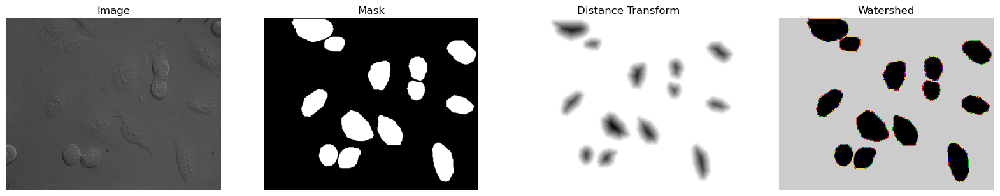

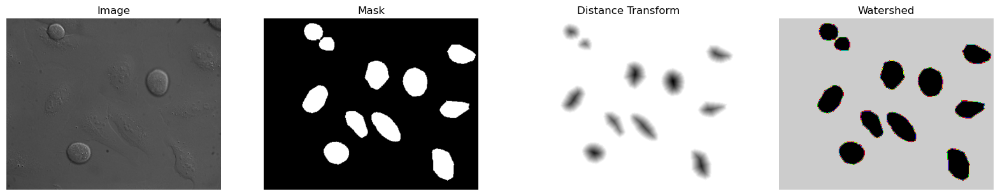

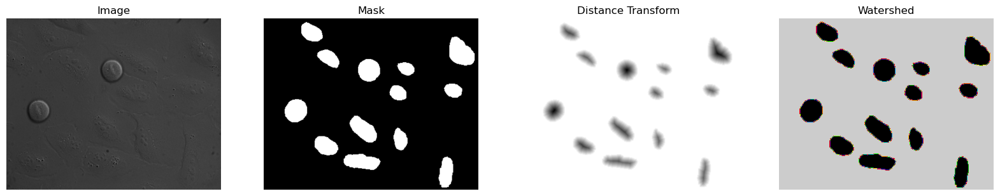

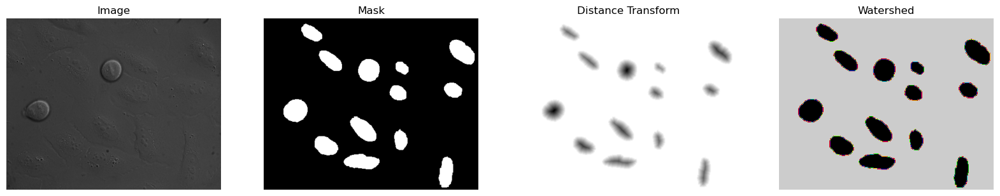

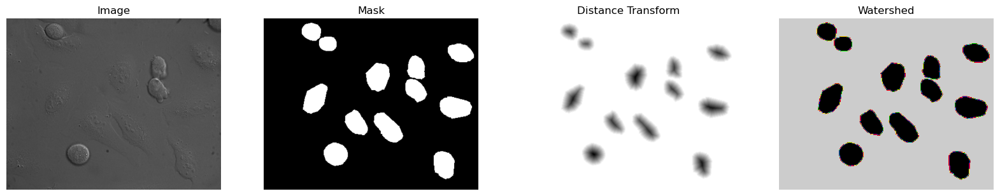

...

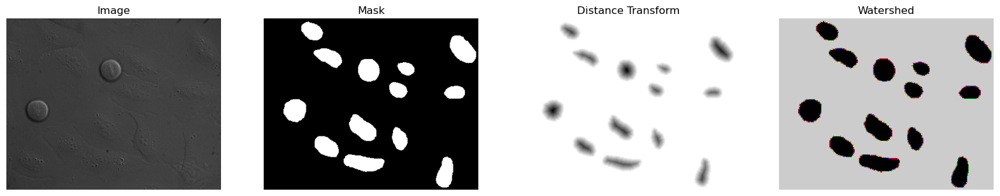

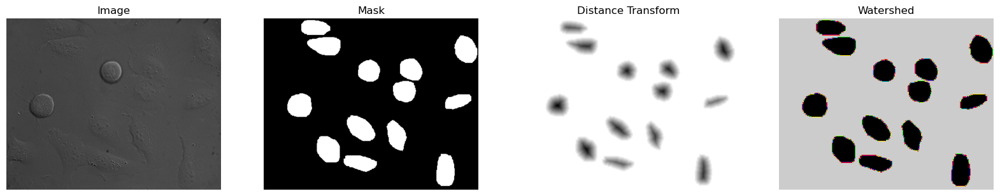

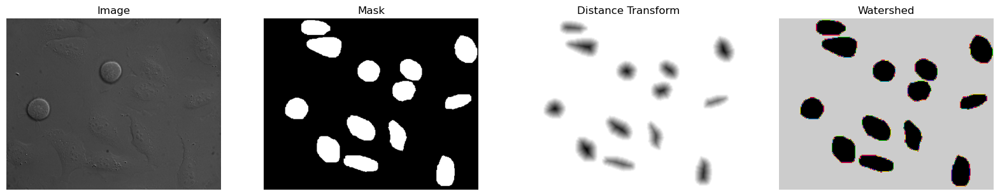

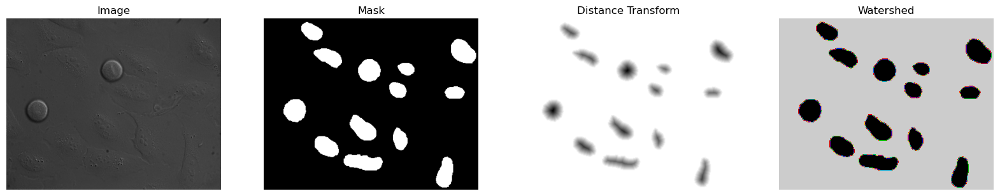

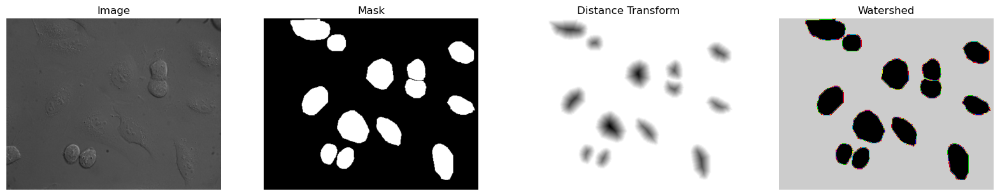

Watershed segmentation completed.


In [8]:
# Directory setup
IMAGE_DIR = "MI01"
MASKS_DIR = f"{IMAGE_DIR}/Masks"
IMAGES_DIR = f"{IMAGE_DIR}/Images"

watershed_video_labels = []
watershed_video_markers = []

# Instantiate the Watershed class
w = Watershed()

for img in os.listdir(MASKS_DIR):
    # Load the original image and the corresponding mask
    image = cv2.imread(f"{IMAGES_DIR}/I{img[1:]}")
    mask_img = cv2.imread(f"{MASKS_DIR}/{img}")
    mask_img = cv2.cvtColor(mask_img, cv2.COLOR_BGR2GRAY)

    # Threshold the mask to create a binary mask
    _, binary_mask = cv2.threshold(mask_img, 0, 1, cv2.THRESH_BINARY)
    mask = np.array(binary_mask, dtype=bool)

    # Compute the distance transform for the binary mask
    distance_transform = ndi.distance_transform_edt(mask)

    # Detect peaks in the distance transform to use as markers
    coords = peak_local_max(distance_transform, min_distance=40, labels=mask)

    # Initialize markers
    watershed_mask = np.zeros(distance_transform.shape, dtype=bool)
    watershed_mask[tuple(coords.T)] = True
    markers, _ = ndi.label(watershed_mask)

    # Apply the Watershed algorithm
    watershed_labels = w.apply(-distance_transform, mask)

    # Append the results for video processing
    watershed_video_labels.append(watershed_labels)
    watershed_video_markers.append(markers)

    # Visualization of the results
    fig, ax = plt.subplots(1, 4, figsize=(20, 15))
    ax[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    ax[0].set_title("Image")
    ax[0].axis("off")
    ax[1].imshow(mask, cmap="gray")
    ax[1].set_title("Mask")
    ax[1].axis("off")
    ax[2].imshow(-distance_transform, cmap=plt.cm.gray)
    ax[2].set_title("Distance Transform")
    ax[2].axis("off")
    ax[3].imshow(watershed_labels, cmap=plt.cm.nipy_spectral)
    ax[3].set_title("Watershed")
    ax[3].axis("off")

    plt.show()

print("Watershed segmentation completed.")

In [9]:
print(watershed_labels)

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


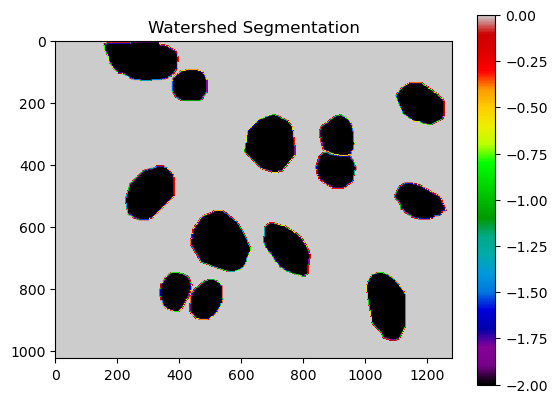

In [10]:
plt.imshow(watershed_labels, cmap='nipy_spectral')
plt.title("Watershed Segmentation")
plt.colorbar()
plt.show()

In [11]:
print(watershed_labels[:10, :10])

[[0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0]]


In [12]:
unique_labels = np.unique(watershed_labels)
print(f"Unique labels: {unique_labels}")
print(f"Total objects (excluding background): {len(unique_labels) - 1}")

Unique labels: [-2  0]
Total objects (excluding background): 1


[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [18]:
np.savetxt("watershed_labels.txt", watershed_labels, fmt='%d')